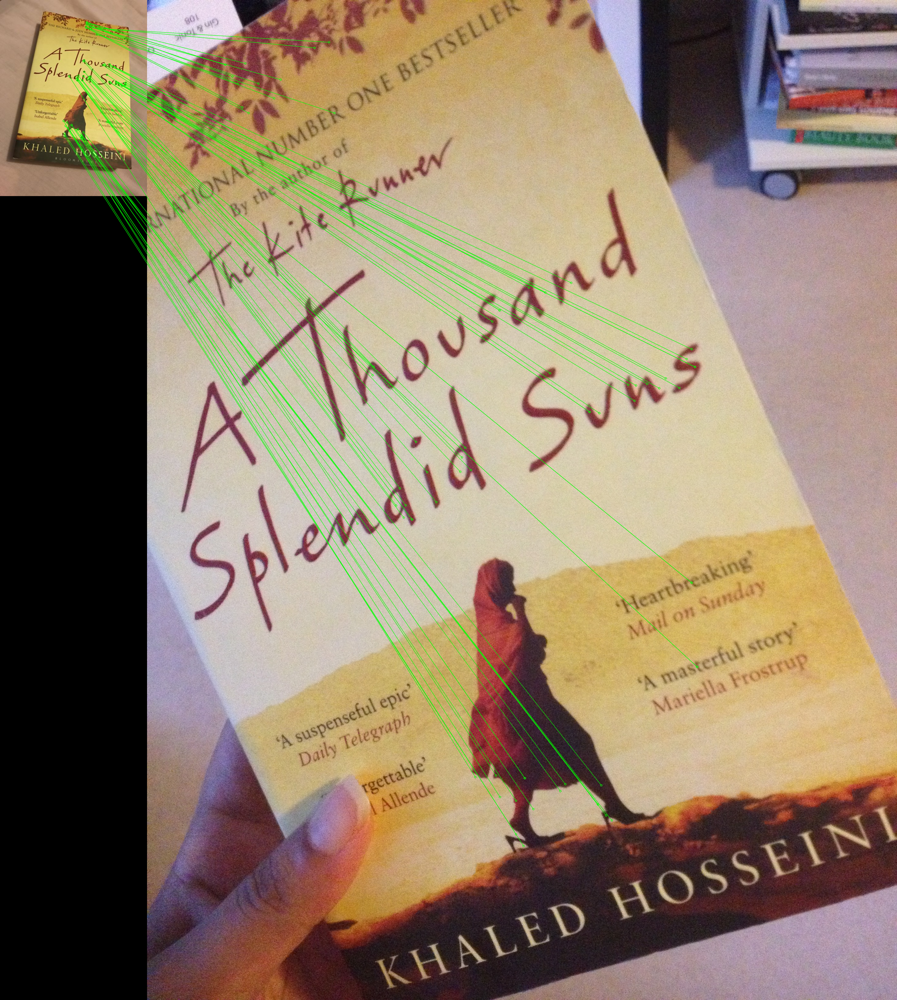

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load dataset of pictures
img1 = cv2.imread("/content/images/image_1.jpg")
img2 = cv2.imread("/content/images/image_2.jpg")

# Apply pre-processing if needed on the data
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# SIFT descriptor
sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)

# Feature matching using FLANN matcher
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1, des2, k=2)

# Apply ratio test to find good matches
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# RANSAC to find homography matrix
MIN_MATCH_COUNT = 10
if len(good_matches) > MIN_MATCH_COUNT:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    matchesMask = mask.ravel().tolist()
else:
    print("Not enough matches are found - %d/%d" % (len(good_matches), MIN_MATCH_COUNT))
    matchesMask = None

# Draw matches between images
draw_params = dict(matchColor=(0, 255, 0), singlePointColor=None, matchesMask=matchesMask, flags=2)
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, **draw_params)

# Show the matched images
cv2_imshow( img_matches)
cv2.waitKey(0)
cv2.destroyAllWindows()